## Import relevant libraries

In [ ]:
!pip install -q -U fireducks ydata_profiling catboost
# fireducks is a linux only package, so it will not work on windows
# it's quicker than pandas that's it

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.1 MB/s eta 0:00:00


In [ ]:
# Loading Dataframe
import fireducks.pandas as pd
# Performing Log and BoxCox Transform for skewed data
from scipy.special import boxcox1p
# Auto EDA tools
from ydata_profiling import ProfileReport
# Plotting tools
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
# Feature Selector chi2 and RFE
from sklearn.feature_selection import SelectKBest, chi2, RFE
# Standard Scaler
from sklearn.preprocessing import StandardScaler
# Classifiers from sklearn
from sklearn.linear_model import LogisticRegression # needs scaling
from sklearn.ensemble import ExtraTreesClassifier # doesn't need scaling
from sklearn.svm import SVC # needs scaling
import catboost as cb #doesn't need scaling
from sklearn.tree import DecisionTreeClassifier # doesn't need scaling
from sklearn.naive_bayes import GaussianNB #doesn't need scaling
# Evaluation Metrics
from sklearn.metrics import classification_report
# Saving Model , Scaler and Features
import pickle as pkl

## Load the dataset and Explore

In [ ]:
df = pd.read_csv('Data/train.csv')
df.head(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
ProfileReport(df.to_pandas(),explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Report Summary
Duplicates: ❎ <br>

Missing Values Portion : 0.1% (we can safely drop them)

Outliers: fc

Correlations:
1. pc is highly correlated to fc
2. px_width is highly correlated to px_height
3. ram is correlated with price_range
4. 3g is highly correlated with 4g

Skewness:
Some features are right skewed like **fc** and we will need to scale the dataset (but after choosing the important features)


## Removing Missing Values

In [98]:
df = df.dropna()
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

## Dealing with Outliers and fix skewness

we can observe positive skewness and outliers in 'fc' , 'sc_w' and 'px_height'

On research , The values are normal to exist in a mobile. I will deal with the skewness of the features using boxcox

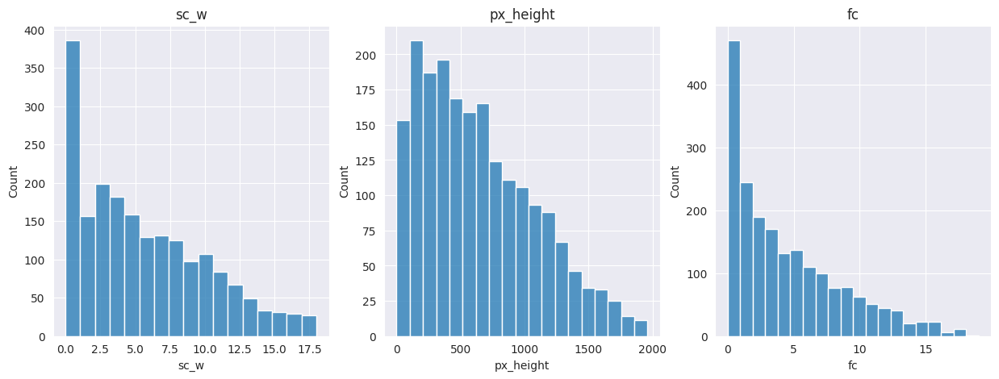

In [50]:
# plot , sc_w and px_height
fig, axes = plt.subplots(1,3)
fig.set_size_inches(15,5)
sns.histplot(df['sc_w'], ax=axes[0])
sns.histplot(df['px_height'], ax=axes[1])
sns.histplot(df['fc'], ax=axes[2])
axes[0].set_title('sc_w')
axes[1].set_title('px_height')
axes[2].set_title('fc')
plt.show()

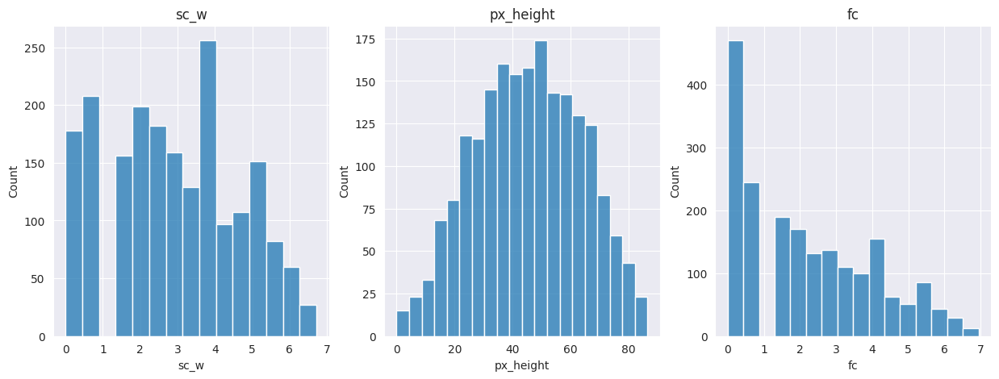

In [65]:
# perform boxcox1p since some values = 0 and it doesn't allow zeros
# performs 0.5 * log(1+x) / 0.5 over the features
# plot , sc_w and px_height
fig, axes = plt.subplots(1,3)
fig.set_size_inches(15,5)
sns.histplot(boxcox1p(df['sc_w'],0.5), ax=axes[0])
sns.histplot(boxcox1p(df['px_height'],0.5), ax=axes[1])
sns.histplot(boxcox1p(df['fc'],0.5), ax=axes[2])
axes[0].set_title('sc_w')
axes[1].set_title('px_height')
axes[2].set_title('fc')
plt.show()

In [66]:
# the histograms have adjusted a lil bit , now perform the transformation
# this lessens the accuracy of the logistic regression , so I won't do it
# df['sc_w'] = boxcox1p(df['sc_w'],0.5)
# df['px_height'] = boxcox1p(df['px_height'],0.5)
# df['fc'] = boxcox1p(df['fc'],0.5)


## Extra Insights

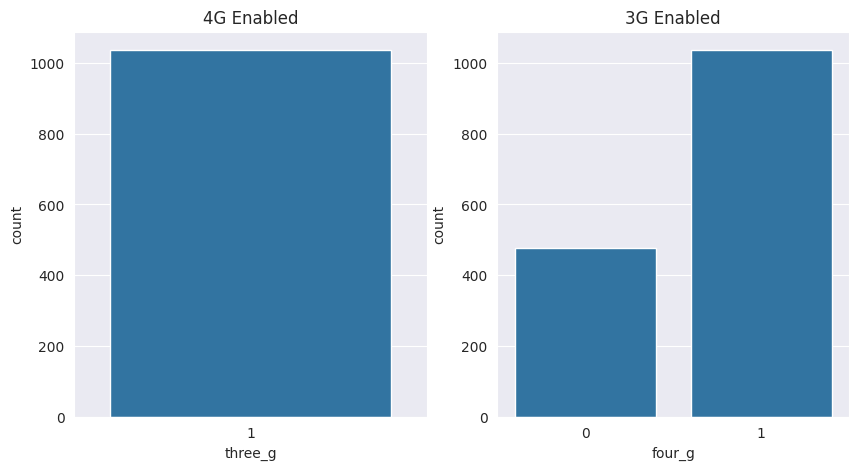

In [67]:
# For any 4G Mobile , It must be 3G enabled but not vice versa
fourg_enabled = df.query("four_g == 1.0").loc[:,'three_g']
threeg_enabled = df.query("three_g == 1.0").loc[:,'four_g']

# plotting two subplots
fig, axes = plt.subplots(1,2)
fig.set_size_inches(10,5)
sns.countplot(x=fourg_enabled, ax=axes[0])
sns.countplot(x=threeg_enabled, ax=axes[1])
axes[0].set_title('4G Enabled')
axes[1].set_title('3G Enabled')
plt.show()


del fourg_enabled , threeg_enabled

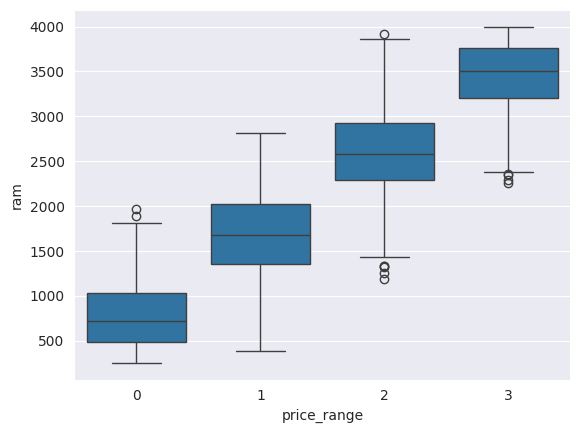

In [69]:
# View RAM against Price Range
sns.boxplot(x='price_range', y='ram', data=df)
plt.show()

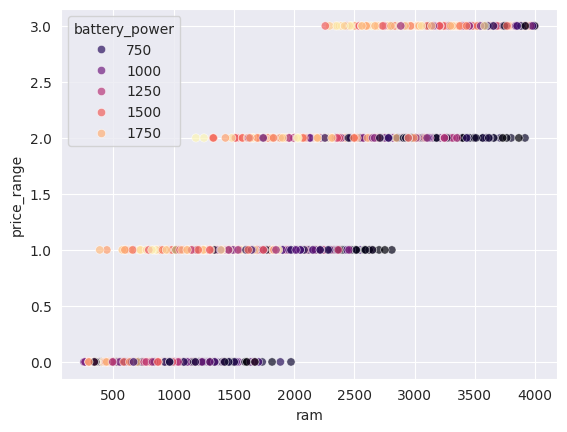

In [78]:
sns.scatterplot(x='ram', y='price_range', data=df, hue='battery_power',alpha=0.7,palette='magma')
plt.show()

### Observations

1. 4G enabled are 3G enabled for sure
2. RAM affects price_range
3. Phones with high battery power lies in top price ranges

## Feature Scaling

In [99]:
# split to inputs and outputs
inputs = df.drop('price_range', axis=1)
target = df['price_range']

# scale the data

scaler = StandardScaler()
inputs_scaled = scaler.fit_transform(inputs)
inputs_scaled = pd.DataFrame(inputs_scaled, columns=inputs.columns)


## Features Selection

In [100]:

# SelectKBest and RBF for determining important features

feature_selector_kbest = SelectKBest(chi2, k=5)
feature_selector_rfe = RFE(estimator=LogisticRegression(), n_features_to_select=5)

# return the features chosen by the feature selectors

feature_selector_kbest.fit(inputs, target)

inputs.columns[feature_selector_kbest.get_support()]


Index(['battery_power', 'mobile_wt', 'px_height', 'px_width', 'ram'], dtype='object')

In [101]:
feature_selector_rfe.fit(inputs_scaled, target)

inputs_scaled.columns[feature_selector_rfe.get_support()]

Index(['battery_power', 'mobile_wt', 'px_height', 'px_width', 'ram'], dtype='object')

In [84]:
# cleanup
import gc
gc.collect()

0

### Common Features to be selected
- RAM
- Battery Power
- Mobile Width
- PX's height
- PX's width

In [102]:
selected_features = inputs_scaled.columns[feature_selector_rfe.get_support()]

In [103]:
inputs = inputs[selected_features]
inputs_scaled = inputs_scaled[selected_features]
inputs_scaled.head()

,battery_power,mobile_wt,px_height,px_width,ram
0,-0.901577,1.348883,-1.410895,-1.146588,0.392123
1,-0.494324,-0.120463,0.587570,1.706476,0.467715
2,-1.536345,0.133847,1.395989,1.076579,0.441903
3,-1.418037,-0.261747,1.289856,1.238685,0.594930
4,1.325799,0.020820,1.271790,-0.090584,-0.656938


## Models Comparisons

In [104]:
from sklearn.model_selection import train_test_split
#scaled features for the models that need normalization
X_trainS, X_testS, y_trainS, y_testS = train_test_split(inputs_scaled, target, test_size=0.2, random_state=42)
# unscaled features for the rest
X_train , X_test , y_train , y_test = train_test_split(inputs, target, test_size=0.2, random_state=42)

In [108]:
models = [('Logistic Regression', LogisticRegression(solver='newton-cg')),
          ('ExTra', ExtraTreesClassifier(n_estimators=100, random_state=5)),
          ('SVM', SVC()),
          ('CatBoost', cb.CatBoostClassifier(iterations=500,learning_rate=0.05,verbose=0)),
          ('DT', DecisionTreeClassifier()),
          ('Naive Bayes', GaussianNB())]

for name, model in models:
    print(f"Training Model : {name}")
    if name in ['Logistic Regression', 'SVM']:
        model.fit(X_trainS, y_trainS)
        y_pred = model.predict(X_testS)
        print(classification_report(y_testS, y_pred))
        print('-'*50)
    else:
        model.fit(X_train.to_pandas(), y_train.to_pandas())
        y_pred = model.predict(X_test.to_pandas())
        print(classification_report(y_test, y_pred))
        print('-'*50)


Training Model : Logistic Regression
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       106
           1       0.95      0.99      0.97        89
           2       0.99      0.94      0.97       107
           3       0.98      1.00      0.99        97

    accuracy                           0.98       399
   macro avg       0.98      0.98      0.98       399
weighted avg       0.98      0.98      0.98       399

--------------------------------------------------
Training Model : ExTra
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       106
           1       0.90      0.92      0.91        89
           2       0.93      0.87      0.90       107
           3       0.92      0.97      0.94        97

    accuracy                           0.93       399
   macro avg       0.93      0.93      0.93       399
weighted avg       0.93      0.93      0.93       399

-------------------

In [109]:
gc.collect()

1840

## Logistic_Regression Model
Optimizing and Tuning

In [115]:
import warnings
warnings.filterwarnings('ignore')

In [116]:
# grid search for params hypertuning
from sklearn.model_selection import GridSearchCV
param_grid = {'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'C': [0.1 , 1 , 10],
              'penalty' : ['l2','elasticnet']}
# micro Calculate metrics globally by counting the total true positives, false negatives and false positives
grid_search = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='f1_micro')
grid_search.fit(X_trainS, y_trainS)
best_model = grid_search.best_estimator_
print(best_model)
best_params = grid_search.best_params_
print(best_params)


LogisticRegression(C=10, solver='newton-cg')
{'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}


In [120]:
model = LogisticRegression(**best_params)
model.fit(X_trainS, y_trainS)
y_pred = model.predict(X_testS)
print(classification_report(y_testS, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       106
           1       0.95      0.99      0.97        89
           2       0.98      0.94      0.96       107
           3       0.98      0.99      0.98        97

    accuracy                           0.98       399
   macro avg       0.98      0.98      0.98       399
weighted avg       0.98      0.98      0.98       399



In [127]:
model.predict(X_testS)[0]

2

In [126]:
model.predict_proba(X_testS)[0]

array([5.45768125e-12, 2.25622817e-03, 9.95929827e-01, 1.81394469e-03])

comment : Model Accuracy hasn't changed much after hyperparameter tuning , so to save time and computational cost , we might skip running it again

## Model/Feature Saving

In [121]:
# Pickle Save Features , Model and Scaler
with open('output/features.pkl', 'wb') as f:
    pkl.dump(tuple(selected_features), f)

with open('output/model.pkl', 'wb') as f:
    pkl.dump(best_model, f)

with open('output/scaler.pkl', 'wb') as f:
    pkl.dump(scaler, f)

